# Computer Vision – Data Augmentation

### Setup

In [4]:
import imgaug as ia
import numpy as np
import os, re
import cv2 as cv
from pathlib import Path
from PIL import Image
from imgaug import augmenters as iaa
from matplotlib import pyplot as plt
from scipy.misc import imsave

In [5]:
path = os.getcwd()
parent_path = os.path.abspath(os.path.join(path, os.pardir))
pathlist = Path("C:/Users/algonzalez/source/repos/Sener-Images/source/dataset/images").glob('**/*.bmp')

data_images = []
for path in pathlist:
    filenames = []
    path_in_str = str(path)

    local_file_list = []
    local_file_list.append(path_in_str)
    file_num = len(local_file_list)

    for i in range(file_num):
        local_file = os.path.join(local_file_list[i])

    filename = os.path.basename(local_file)
    name = os.path.splitext(filename)[0]
    filenames.append(name)
    print("Reading file ", local_file)
    img = cv.imread(local_file)
    rgb_img = cv.cvtColor(img, cv.COLOR_RGB2BGR) 
    data_images.append(rgb_img)

Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_1.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_10.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_11.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_12.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_13.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_14.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_15.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_16.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_17.bmp
Reading file  C:\Users\algonzalez\source\repos\Sener-Images\source\dataset\images\image_18.bmp
Reading file  C:\Users\algonzalez\source\repos\Sene

In [6]:
def data_augmentation():
    sometimes = lambda aug: iaa.Sometimes(0.5, aug)

    seq = iaa.Sequential(
        [
            iaa.Fliplr(0.5),
            iaa.Flipud(0.2), 
            sometimes(iaa.CropAndPad(
                percent=(-0.05, 0.1),
                pad_mode=ia.ALL,
                pad_cval=(0, 255)
            )),
            sometimes(iaa.Affine(
                scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
                translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
                rotate=(-45, 45),
                shear=(-16, 16), 
                order=[0, 1],
                cval=(0, 255),
                mode=ia.ALL
            )),
            iaa.SomeOf((0, 5),
                [
                    sometimes(iaa.Superpixels(p_replace=(0, 1.0), n_segments=(20, 200))),
                    iaa.OneOf([
                        iaa.GaussianBlur((0, 3.0)),
                        iaa.AverageBlur(k=(2, 7)),
                        iaa.MedianBlur(k=(3, 11)),
                    ]),
                    iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 1.5)),
                    iaa.Emboss(alpha=(0, 1.0), strength=(0, 2.0)),
                ],
                random_order=True
            )
        ],
        random_order=True
    )
    return seq

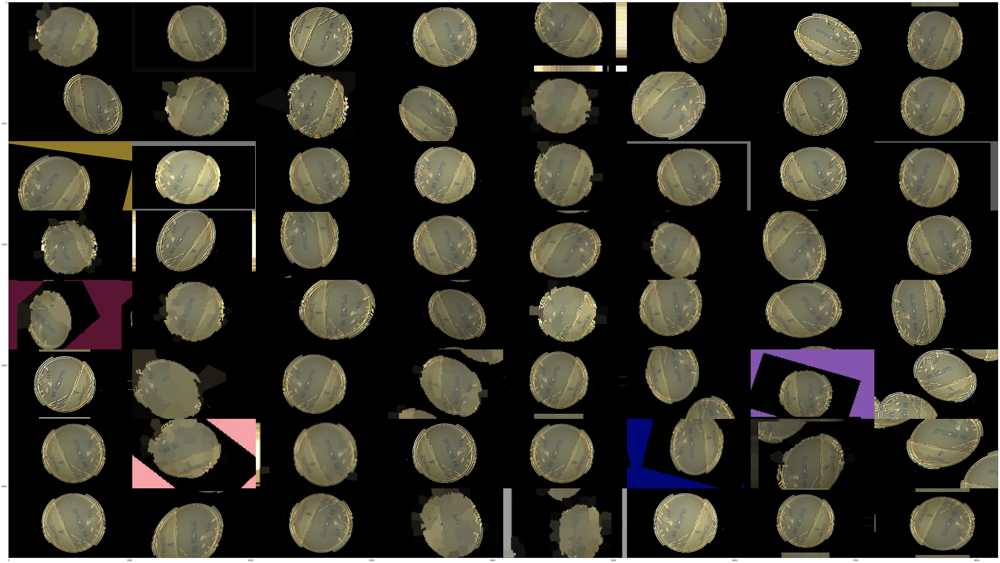

In [9]:
for i, image in enumerate(data_images):
    seq = data_augmentation()
    seq.show_grid(image, cols=8, rows=8)
    break